In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [ ]:
cd 'drive/My Drive/SDG'

/content/drive/My Drive/SDG


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Find Outlier

In [ ]:
import numpy as np

In [ ]:
df = pd.read_csv('Ratings_Boohoo.csv')
thresh = pd.read_csv('thresh.csv')

In [ ]:
df_diff = df[['MA_7day_1', 'MA_7day_2', 'MA_7day_3',
       'MA_7day_4', 'MA_7day_5', 'MA_7day_6', 'MA_7day_7', 'MA_7day_8',
       'MA_7day_9', 'MA_7day_10', 'MA_7day_11', 'MA_7day_12', 'MA_7day_13',
       'MA_7day_14', 'MA_7day_15', 'MA_7day_16', 'MA_7day_17', 'MA_7day_Mean']].diff()
columns_lst = ['diff_'+str(i) for i in range(1,18)]
columns_lst.append('diff_Mean')
df_diff.columns = columns_lst

df_merge = pd.concat([df,df_diff],axis=1)
first = min(df_merge['date'])
indexer = df_merge[df_merge['date']== first].index
df_merge.loc[indexer, columns_lst]= float("NAN")

In [ ]:
def level(thresh, MA, DIFF,count_, std_, sdg, freq):
    if freq == "day":
        ind=0
    elif freq == "week":
        ind=1
    else:
        ind=2

    scale=thresh['level'][ind] 
    count=thresh['count'][ind]
    std=thresh['std'][ind]
    diff=thresh['change'][ind]
    count2 = thresh['SDG_'+str(sdg)+'_count'][ind]
    std2 = thresh['SDG_'+str(sdg)+'_std'][ind]

    if (abs(MA) < scale) or (abs(DIFF) < diff):
        return 0
    if MA>0:
        if count_ >= count2 and std_ <= std2:
            return 2
        else:
            return 1
    elif MA < 0:
        if count_ >= count2 and std_ <= std2:
            return -2
        else:
            return -1
    else: return 0


def heatmapf(df, thresh, freq='day'):
    col = ["date"]
    for sdg in range(1,18):
        col.append('MA_7day_'+str(sdg))
    df = df.reset_index(drop=True)
    score =  df[col]
    # generate a color label table
    color = pd.DataFrame(columns=col)
    color['date']=score['date']
    """
    Outlier parameter
    """
    for sdg in range(1,18):    
        for i in range(len(df)):
            MA = df['MA_7day_'+str(sdg)][i]
            DIFF = df['diff_'+str(sdg)][i]
            count_ = df['SDG_' + str(sdg) + '_count'][i]
            std_ = df['SDG_' + str(sdg) + '_std'][i]
            color['MA_7day_'+str(sdg)][i] = level(thresh, MA, DIFF, count_, std_, sdg, freq)
    # replace nan with '-'
    for c in col[1:]:    
        for i in range(len(score)):
            if abs(score[c][i]) <= 100:
                score[c][i] = round(score[c][i],2)
            else: score[c][i] = '-'
    return color, score

In [ ]:
sample = df_merge[df_merge['date']>='2020-06-01']
sample = sample.sort_values(by='date', ascending=False)
sample = sample.reset_index(drop=True)
sample

,Unnamed: 0,date,Ticker,COMPANY,GICS Sector,SDG_1,SDG_2,SDG_3,SDG_4,SDG_5,SDG_6,SDG_7,SDG_8,SDG_9,SDG_10,SDG_11,SDG_12,SDG_13,SDG_14,SDG_15,SDG_16,SDG_17,SDG_Mean,MA_7day_1,MA_7day_2,MA_7day_3,MA_7day_4,MA_7day_5,MA_7day_6,MA_7day_7,MA_7day_8,MA_7day_9,MA_7day_10,MA_7day_11,MA_7day_12,MA_7day_13,MA_7day_14,MA_7day_15,MA_7day_16,MA_7day_17,...,SDG_15_std,SDG_16_std,SDG_17_std,SDG_std_Mean,SDG_1_count,SDG_2_count,SDG_3_count,SDG_4_count,SDG_5_count,SDG_6_count,SDG_7_count,SDG_8_count,SDG_9_count,SDG_10_count,SDG_11_count,SDG_12_count,SDG_13_count,SDG_14_count,SDG_15_count,SDG_16_count,SDG_17_count,SDG_count_Mean,diff_1,diff_2,diff_3,diff_4,diff_5,diff_6,diff_7,diff_8,diff_9,diff_10,diff_11,diff_12,diff_13,diff_14,diff_15,diff_16,diff_17,diff_Mean
0,1485,2020-08-27,BHOOY,BOOHOO GROUP PLC - UNSP ADR,Consumer Discretionary,NaN,NaN,-0.362319,NaN,NaN,NaN,NaN,-0.362319,NaN,-0.362319,-0.362319,NaN,NaN,NaN,NaN,NaN,NaN,-0.362319,-1.103167,-1.200452,0.038985,-0.976689,-0.775374,-0.591406,-0.840081,0.161105,-0.783118,-0.013747,0.011140,-0.341933,0.301354,-0.160288,0.305316,-0.052934,-0.029287,...,NaN,NaN,NaN,2.000000,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,-0.062497,0.0,0.0,0.0,0.0,-0.055849,0.0,0.032402,-0.056083,0.000000,0.0,0.0,0.0,0.000000,0.0,-0.011580
1,1484,2020-08-26,BHOOY,BOOHOO GROUP PLC - UNSP ADR,Consumer Discretionary,NaN,NaN,-0.058456,NaN,NaN,NaN,NaN,0.350845,NaN,0.147638,-0.058456,NaN,NaN,NaN,NaN,-0.665188,NaN,-0.056724,-1.103167,-1.200452,0.101482,-0.976689,-0.775374,-0.591406,-0.840081,0.216954,-0.783118,-0.046149,0.067223,-0.341933,0.301354,-0.160288,0.305316,-0.052934,-0.029287,...,NaN,2.0,NaN,0.755838,NaN,NaN,6.0,NaN,NaN,NaN,NaN,4.0,NaN,5.0,6.0,NaN,NaN,NaN,NaN,1.0,NaN,4.4,0.0,0.0,-0.044420,0.0,0.0,0.0,0.0,0.149276,0.0,0.158373,-0.031834,0.000000,0.0,0.0,0.0,0.000200,0.0,0.015912
2,1483,2020-08-25,BHOOY,BOOHOO GROUP PLC - UNSP ADR,Consumer Discretionary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.103167,-1.200452,0.145901,-0.976689,-0.775374,-0.591406,-0.840081,0.067679,-0.783118,-0.204522,0.099057,-0.341933,0.301354,-0.160288,0.305316,-0.053133,-0.029287,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
3,1482,2020-08-24,BHOOY,BOOHOO GROUP PLC - UNSP ADR,Consumer Discretionary,NaN,NaN,0.126904,NaN,NaN,NaN,NaN,0.126904,NaN,NaN,0.126904,0.126904,NaN,NaN,NaN,NaN,NaN,0.126904,-1.103167,-1.200452,0.145901,-0.976689,-0.775374,-0.591406,-0.840081,0.067679,-0.783118,-0.204522,0.099057,-0.341933,0.301354,-0.160288,0.305316,-0.053133,-0.029287,...,NaN,NaN,NaN,2.000000,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,0.028407,0.0,0.0,0.0,0.0,0.114406,0.0,0.000000,0.020461,0.237299,0.0,0.0,0.0,0.000000,0.0,0.030436
4,1481,2020-08-23,BHOOY,BOOHOO GROUP PLC - UNSP ADR,Consumer Discretionary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.103167,-1.200452,0.117494,-0.976689,-0.775374,-0.591406,-0.840081,-0.046727,-0.783118,-0.204522,0.078597,-0.579232,0.301354,-0.160288,0.305316,-0.053133,-0.029287,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,1402,2020-06-05,BHOOY,BOOHOO GROUP PLC - UNSP ADR,Consumer Discretionary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.252755,-1.301926,0.338295,0.392654,NaN,NaN,-0.171285,0.210583,-0.310911,-0.365087,0.101901,-0.316055

In [ ]:
color, score = heatmapf(sample,thresh,freq='day')

In [ ]:
score

In [ ]:
heat_data = color.iloc[:,1:].to_numpy()
heat_data = heat_data.astype(np.int32)
label = score.iloc[:,1:].to_numpy()
label = label.astype(np.str)

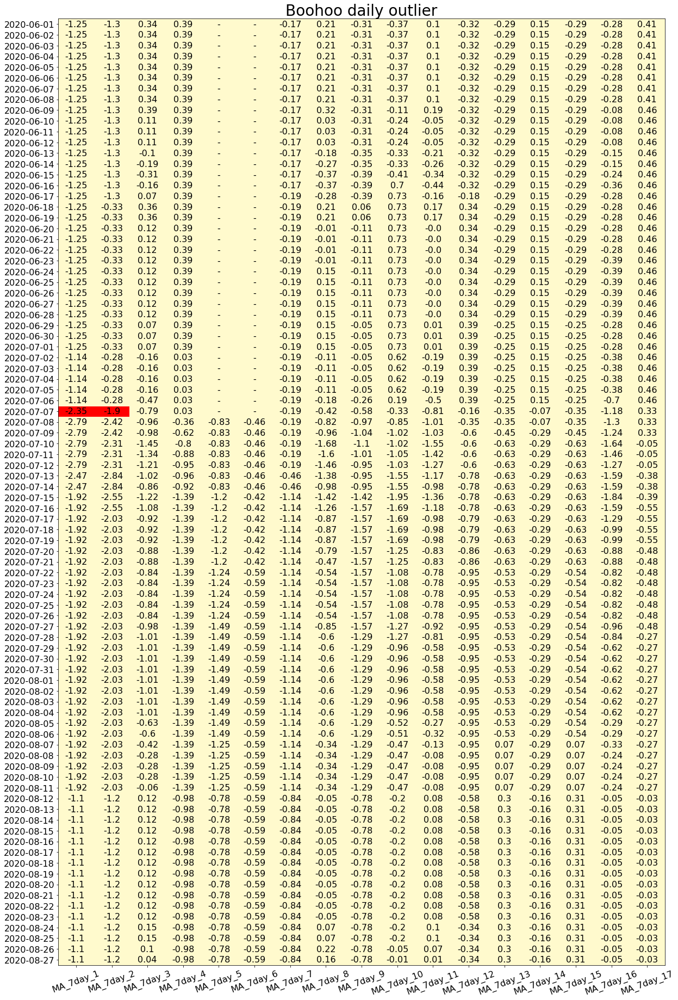

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20,32))
data = heat_data
labels = label
xtick = list(color.columns)[1:]
ytick = list(color['date'])
cmap = matplotlib.colors.ListedColormap(['red','lightsalmon','lemonchiffon'])
heatmap = plt.pcolor(data, cmap=cmap)#, edgecolors='k', linewidths=2)

for y in range(data.shape[0]):
    for x in range(data.shape[1]):
        plt.text(x+0.5, y+0.5, labels[y][x],
                 horizontalalignment='center',
                 verticalalignment='center', fontsize=16)

# plt.colorbar(heatmap)
plt.xticks(np.arange(0.5,17.5,1), xtick, rotation=20, fontsize = 16)
plt.yticks(np.arange(0.5,88.5,1), ytick, fontsize = 16)
plt.title("Boohoo daily outlier", fontsize=28)
plt.show()

In [ ]:
thresh

,freq,count,std,level,change,SDG_1_count,SDG_1_std,SDG_2_count,SDG_2_std,SDG_3_count,SDG_3_std,SDG_4_count,SDG_4_std,SDG_5_count,SDG_5_std,SDG_6_count,SDG_6_std,SDG_7_count,SDG_7_std,SDG_8_count,SDG_8_std,SDG_9_count,SDG_9_std,SDG_10_count,SDG_10_std,SDG_11_count,SDG_11_std,SDG_12_count,SDG_12_std,SDG_13_count,SDG_13_std,SDG_14_count,SDG_14_std,SDG_15_count,SDG_15_std,SDG_16_count,SDG_16_std,SDG_17_count,SDG_17_std
0,day,0.5,0.5,1.3,0.80,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,3.0,2.0,4.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0
1,week,0.5,0.5,2.3,1.15,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,3.0,2.0,4.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0
2,month,0.5,0.5,2.2,1.75,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,3.0,2.0,4.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,2.0,2.0


In [ ]:
sample[sample['date']=='2020-07-07'][['COMPANY','date','MA_7day_1','SDG_1_std','SDG_1_count','MA_7day_2','SDG_2_std','SDG_2_count']]

,COMPANY,date,MA_7day_1,SDG_1_std,SDG_1_count,MA_7day_2,SDG_2_std,SDG_2_count
51,BOOHOO GROUP PLC - UNSP ADR,2020-07-07,-2.354211,0.00518,2.0,-1.902532,0.00518,2.0


# Rank

## rank outlier

In [ ]:
df = pd.read_csv('urls_2020.csv')
thresh = pd.read_csv('thresh.csv')

In [ ]:
df_diff = df[['MA_7day_1', 'MA_7day_2', 'MA_7day_3',
       'MA_7day_4', 'MA_7day_5', 'MA_7day_6', 'MA_7day_7', 'MA_7day_8',
       'MA_7day_9', 'MA_7day_10', 'MA_7day_11', 'MA_7day_12', 'MA_7day_13',
       'MA_7day_14', 'MA_7day_15', 'MA_7day_16', 'MA_7day_17', 'MA_7day_Mean']].diff()
columns_lst = ['diff_'+str(i) for i in range(1,18)]
columns_lst.append('diff_Mean')
df_diff.columns = columns_lst

df_merge = pd.concat([df,df_diff],axis=1)
first = min(df_merge['date'])
indexer = df_merge[df_merge['date']== first].index
df_merge.loc[indexer, columns_lst]= float("NAN")

In [ ]:
def rank_by_frequency(df, thresh, sdg=1, freq='day',date='all',rank='level', PorN='positive'):
    if freq == 'day':
        ind = 0
    elif freq == 'week':
        ind = 1
    elif freq == 'month':
        ind = 2
    else: return "Please select freq among ['day', 'week', 'month']"

    ind = 0
    level = thresh['level'][ind]
    change = thresh['change'][ind]
    count = thresh['SDG_'+str(sdg)+'_count'][ind]
    std = thresh['SDG_'+str(sdg)+'_std'][ind]

    if date == 'all':
        pass
    else:
        df = df[df['date']==date]
        df = df.reset_index(drop=True)
    if PorN == 'positive':
        df = df[(df['MA_7day_'+str(sdg)]>level) &  (abs(df['diff_'+str(sdg)]) > change) & (df['SDG_'+str(sdg)+'_count']>count) & (df['SDG_'+str(sdg)+'_std']<std)]
    elif PorN == 'all':
        df = df[(abs(df['MA_7day_'+str(sdg)])>level) &  (abs(df['diff_'+str(sdg)]) > change) & (df['SDG_'+str(sdg)+'_count']>count) & (df['SDG_'+str(sdg)+'_std']<std)]
    elif PorN == 'negative':
        df = df[(-(df['MA_7day_'+str(sdg)])>level) &  (abs(df['diff_'+str(sdg)]) > change) & (df['SDG_'+str(sdg)+'_count']>count) & (df['SDG_'+str(sdg)+'_std']<std)]
    else: return "Please select PorN among ['all', 'positive', 'negative']"

    col = ['date', 'COMPANY', 'GICS Sector', 'SDG_'+str(sdg), 'MA_7day_'+str(sdg), 'diff_'+str(sdg), 'SDG_'+str(sdg)+'_count', 'SDG_'+str(sdg)+'_std', 'SDG_'+str(sdg)+'_url']
    df = df[col]
    df = df.reset_index(drop=True)

    if rank == 'level':
        df = df.iloc[(-df['diff_'+str(sdg)].abs()).argsort()]
        df = df.reset_index(drop=True)
        df = df.iloc[(-df['MA_7day_'+str(sdg)].abs()).argsort()]
        df = df.reset_index(drop=True)
    elif rank == 'change':
        df = df.iloc[(-df['MA_7day_'+str(sdg)].abs()).argsort()]
        df = df.reset_index(drop=True)
        df = df.iloc[(-df['diff_'+str(sdg)].abs()).argsort()]
        df = df.reset_index(drop=True)
    else:
        return "Please select rank among ['level', 'change']"
    return df.head(10)

In [ ]:
rank_by_frequency(df=df_merge, thresh=thresh, sdg=1, freq='month',date='all',rank='level', PorN='all')

,date,COMPANY,GICS Sector,SDG_1,MA_7day_1,diff_1,SDG_1_count,SDG_1_std,SDG_1_url
0,2020-01-13,entergy corp,Utilities,-7.262153,-7.370765,-1.319939,122.0,1.003237,['https://www.eagletribune.com/region/recovery...
1,2020-01-15,entergy corp,Utilities,-2.321655,-6.360272,1.331193,3.0,1.346419,['https://wreg.com/2020/01/14/small-arkansas-t...
2,2020-01-22,national oilwell varco inc,Energy,-6.978417,-6.183568,-1.354020,17.0,1.946127,['https://www.mymotherlode.com/news/middle-eas...
3,2020-01-12,entergy corp,Utilities,-8.052610,-6.050826,-1.760807,41.0,1.930106,['https://www.marketscreener.com/ENTERGY-CORPO...
4,2020-02-05,wynn resorts ltd,Consumer Discretionary,-5.595581,-5.610347,-0.921810,10.0,0.471575,['https://www.thegardenisland.com/2020/02/04/n...
5,2020-03-01,molson coors brewing co,Consumer Staples,-6.877998,-5.466277,-1.956696,5.0,0.357414,['https://www.mrt.com/news/crime/article/Lone-...
6,2020-03-04,national oilwell varco inc,Energy,-6.323222,-5.280096,-1.660038,3.0,0.210908,['https://www.washingtonpost.com/world/africa/...
7,2020-01-12,southern co,Utilities,-7.422272,-4.927512,-2.557837,162.0,1.369434,['https://www.reddeeradvocate.com/news/storms-...
8,2020-03-10,moody's corp,Financials,-6.312581,-4.836513,-1.139928,22.0,1.948950,['https://www.thenational.ae/business/lebanon-...
9,2020-02-03,delta air lines inc,Industrials,-5.299238,-4.731303,-0.876921,21.0,1.592533,['http://www.enterstageright.com/archive/artic...


## wordcloud function

In [ ]:
import ast
import math
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import sys
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.corpus import words
import string
from collections import Counter
from wordcloud import WordCloud
import spacy
import multiprocessing
import nltk
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [ ]:
stop_words = set(stopwords.words('english'))
stop_words.add('html')
stop_words.add('.html')
stop_words.add('www')
stop_words.add('http')
stop_words.add('au')
stop_words.add('com')
stop_words.add('https')
stop_words.add('htm')
stop_words.add('php')
stop_words.add('spip')
stop_words.add('id')
stop_words.add('sid')
stop_words.add('cms')
stop_words.add('xhtml') 
stop_words.add('storyid')
stop_words.add('new')
stop_words.add('news')
stop_words.add('whats')
stop_words.add('people')
stop_words.add('put')

set_of_words = set(words.words())

def clean_cell(sample):
    token = []
    url = list(sample.split(', '))
    for item in url:
        result = re.match('.*?//.*?/(.*?)\'.*?',item)
        match = re.findall('\w\w+',result.group(1))
        token += match
    token = [w.lower() for w in token]
    token = [w for w in token if w in set_of_words]
    token = [w for w in token if not w in stop_words]
    text = ','.join(token)
    return text

def return_end_title(url_list):
    title_list = []
    for i in url_list:      
        match = re.findall('\w\w+', i) 
        title_list += match
    return title_list

def clean_wordsList(tokens,stop_words):
    tokens = [w.lower() for w in tokens]
    tokens = [w for w in tokens if w in words.words()]
    tokens = [w for w in tokens if not w in stop_words]    
    return tokens

In [ ]:

def return_word_clouds_data(df,stop_words):
    if len(df) == 0: return
    List = list(df.iloc[:,-1])
    co = list(df.iloc[:,1])
    sdg = list(df.columns)[3]
    date = list(df.iloc[:,0])
    for i in range(len(df)):       
        try:
            urls = ast.literal_eval(List[i])
            word = clean_wordsList(return_end_title(set(urls)),stop_words)
            cout_words = Counter(word)
            wordcloud = WordCloud(max_words =70,max_font_size=200, width=1000, height=500)
            wordcloud.generate_from_frequencies(frequencies = cout_words)  
            plt.figure(figsize=(20,10) )
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.title(date[i]+'/'+sdg+'/'+'Rank: '+str(i+1) + '/'+ co[i], {'fontsize': 18, 'color':'darkred', 'weight':'bold'})
            plt.savefig(sdg+'-'+'Rank:'+str(i+1) +'.png')
        except: pass

# return_word_clouds_data(example,stop_words)
#

## visulization

SDG_13
SDG_14
SDG_15


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


SDG_16
SDG_17


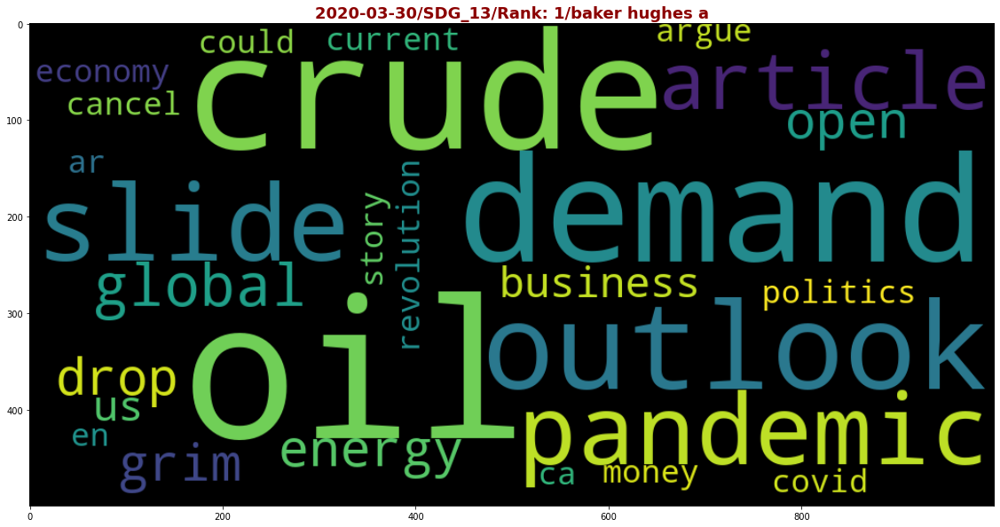

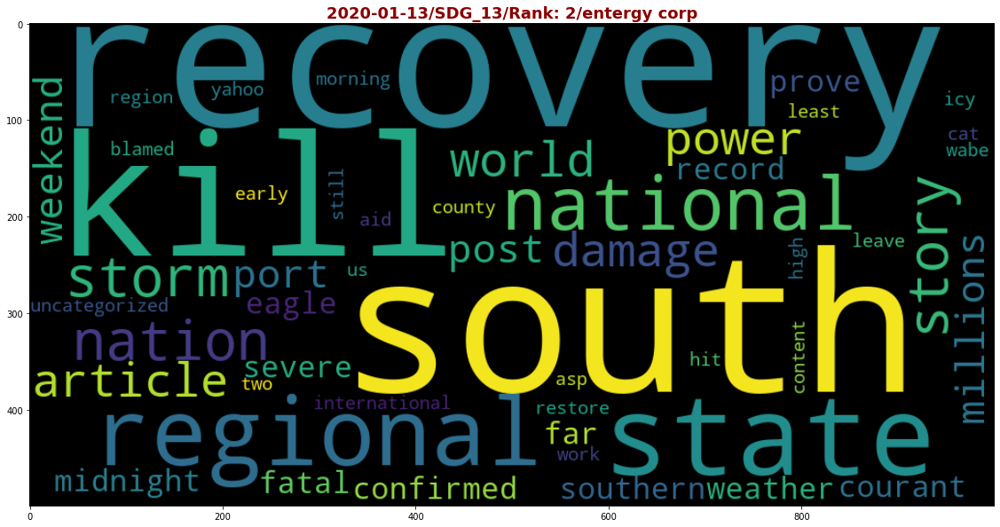

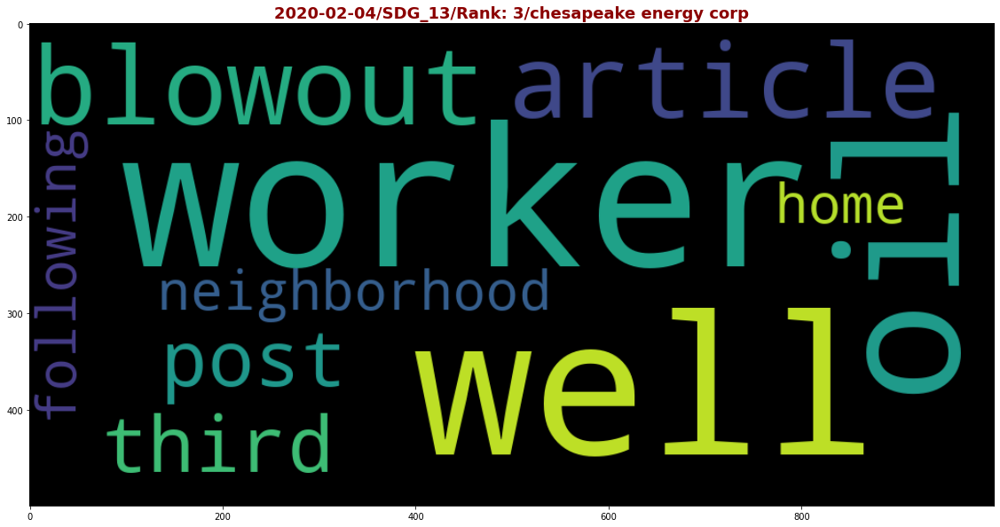

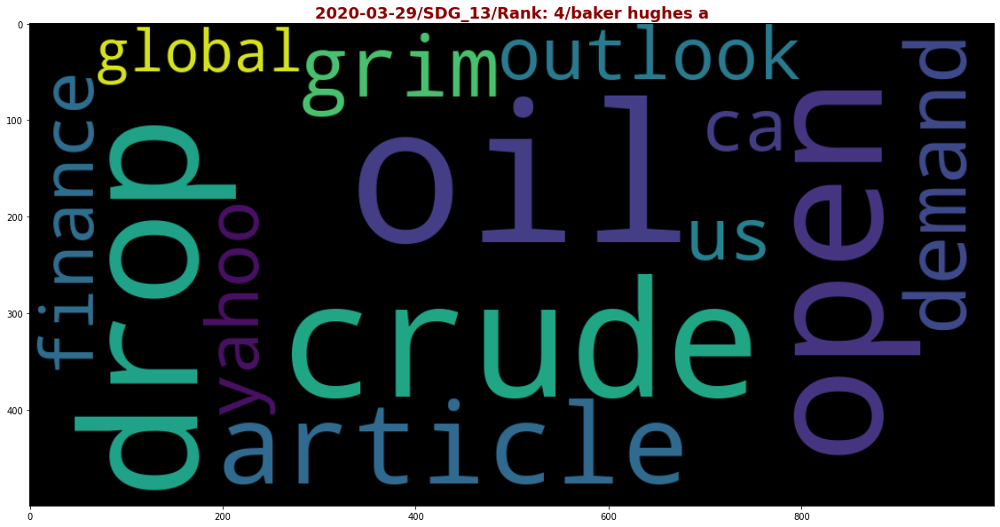

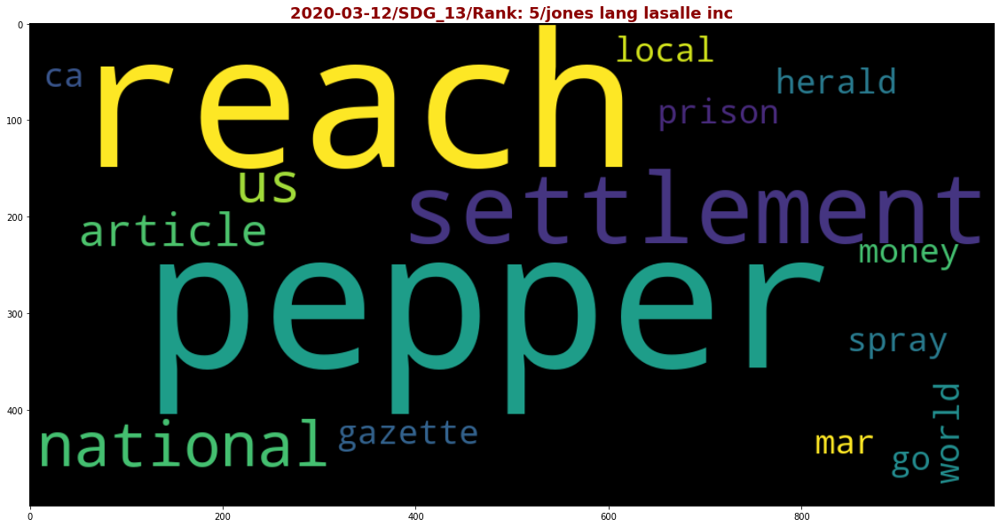

...

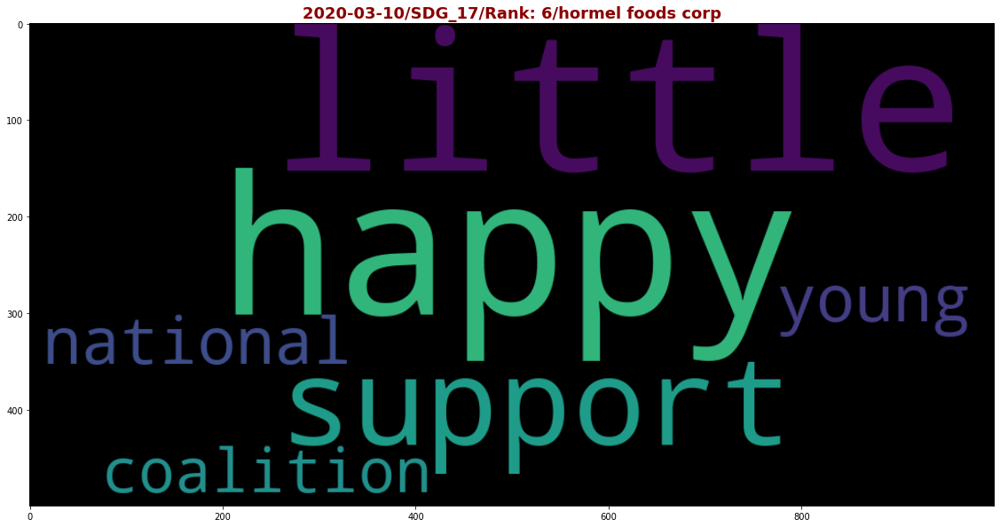

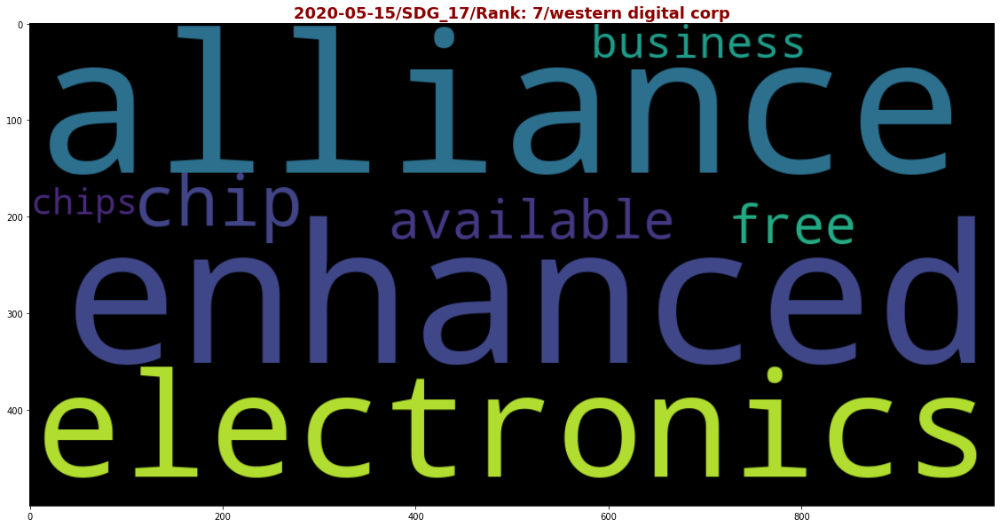

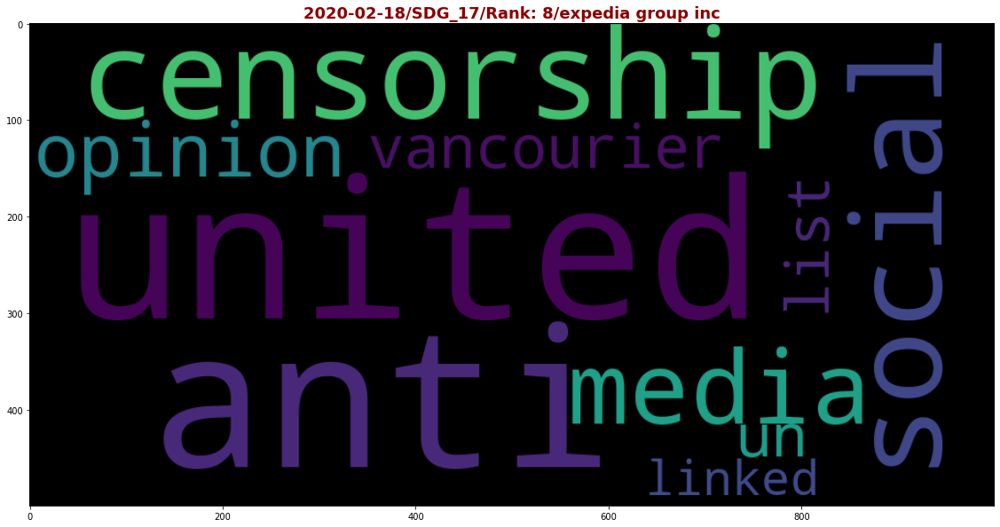

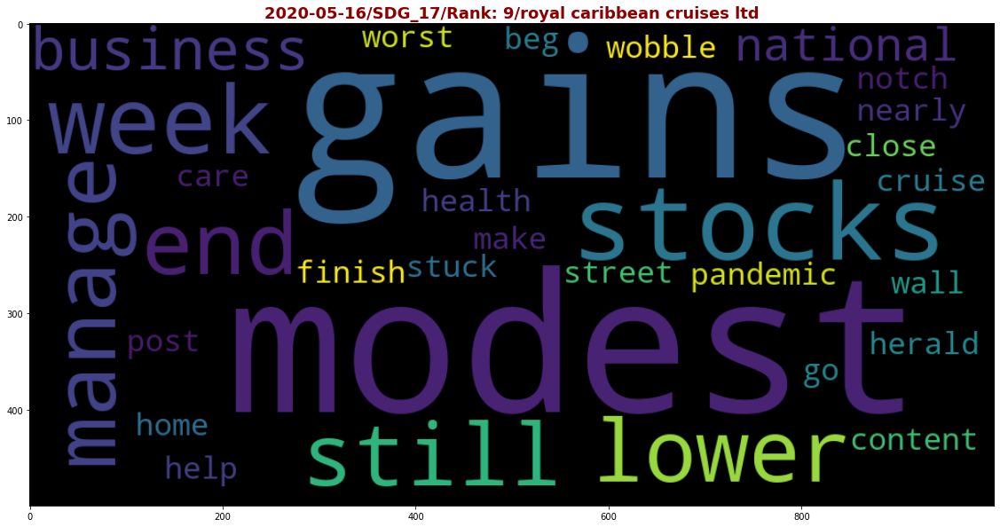

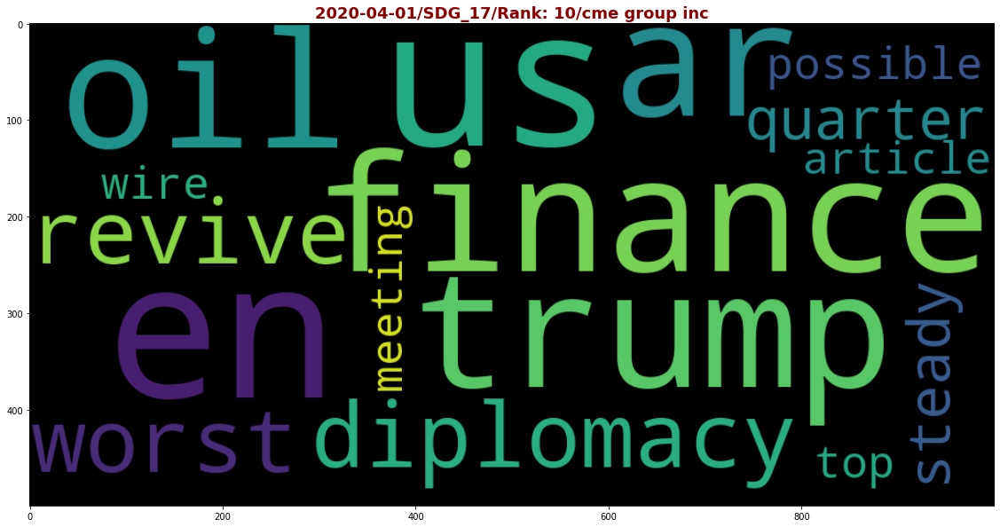

In [ ]:
for i in range(13, 18):
    print('SDG_'+str(i))
    example = rank_by_frequency(df_merge, thresh, sdg=i, freq='month',date='all',rank='level', PorN='all')
    return_word_clouds_data(example,stop_words)

In [ ]:
rank_by_frequency(df_merge, thresh, sdg=6, freq='day',date='all',rank='level', PorN='all')

,date,COMPANY,GICS Sector,SDG_6,MA_7day_6,diff_6,SDG_6_count,SDG_6_std,SDG_6_url
0,2020-03-12,chesapeake energy corp,Energy,-5.367813,-5.988252,-1.010954,14.0,1.431138,['https://www.centralmaine.com/2020/03/11/corp...
1,2020-02-02,chesapeake energy corp,Energy,-6.661968,-5.980892,-1.919510,6.0,0.243226,['https://kelo.com/news/articles/2020/feb/02/t...
2,2020-02-04,gilead sciences inc,Health Care,-5.260975,-5.686806,-0.996516,13.0,0.293270,['https://edition.cnn.com/2020/02/04/asia/wuha...
3,2020-02-29,molson coors brewing co,Consumer Staples,-6.855652,-5.645206,-2.326356,15.0,0.573055,['https://madison.com/wsj/news/local/crime-and...
4,2020-02-29,norwegian cruise line holdings ltd,Consumer Discretionary,-4.886403,-5.414445,-0.920114,28.0,0.675598,['https://www.recorder.com/Wall-Street-has-wor...
5,2020-01-08,news corp,Communication Services,-6.417705,-5.337180,-1.556412,3.0,0.854220,['https://au.news.yahoo.com/firies-impassioned...
6,2020-03-26,moody's corp,Financials,-6.299388,-5.213911,-1.295070,69.0,1.513049,['http://www.digitaljournal.com/news/world/mas...
7,2020-03-11,chesapeake energy corp,Energy,-5.591057,-4.977299,-1.526654,23.0,0.344345,['https://www.sfgate.com/news/article/Corporat...
8,2020-01-19,national oilwell varco inc,Energy,-6.165871,-4.723608,-2.154419,7.0,0.337744,['https://www.thetelegraph.com/news/world/arti...
9,2020-02-03,gilead sciences inc,Health Care,-4.734951,-4.690290,-0.993169,5.0,0.540402,['https://www.msn.com/en-us/finance/other/deat...


# urls

In [ ]:
data = pd.read_csv('Boohoo_URLs.csv')

In [ ]:
data = data[['date']+list(data.columns)[4:]]

In [ ]:
df_merge = df_merge.merge(data, how='outer', left_on='date', right_on='date')
sample = df_merge[(df_merge['date']>='2020-06-10') & (df_merge['date']<='2020-07-01')]
sample

In [ ]:
sample = sample.reset_index(drop=True)

## outlier wordcloud

In [ ]:
import ast

x = data[data['date']=='2020-07-07'][['SDG_1_url','SDG_2_url']].reset_index(drop=True)

In [ ]:
ast.literal_eval(x['SDG_1_url'][0])

['https://www.drapersonline.com/insight/comment/comment-leicester-modern-slavery-claims-are-a-dark-stain-on-fashion',
 'https://www.drapersonline.com/news/comment-leicester-modern-slavery-claims-are-a-dark-stain-on-fashion']

In [ ]:
ast.literal_eval(x['SDG_2_url'][0])

['https://www.drapersonline.com/insight/comment/comment-leicester-modern-slavery-claims-are-a-dark-stain-on-fashion',
 'https://www.drapersonline.com/news/comment-leicester-modern-slavery-claims-are-a-dark-stain-on-fashion']

Text(0.5, 1.0, '2020-07-07/SDG1 & SDG2/Only URL')

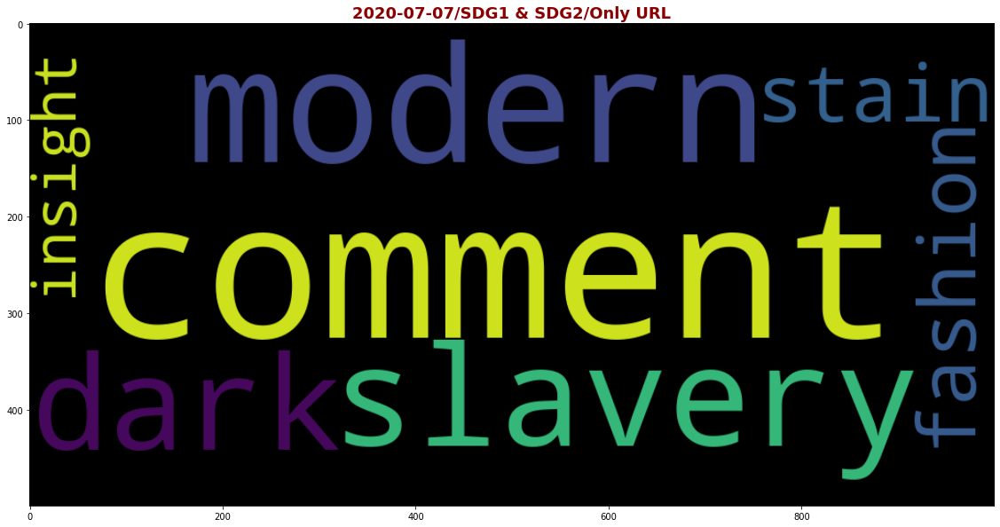

In [ ]:
urls = ast.literal_eval(x['SDG_1_url'][0])
word = clean_wordsList(return_end_title(set(urls)),stop_words)
cout_words = Counter(word)
wordcloud = WordCloud(max_words =70,max_font_size=200, width=1000, height=500)
wordcloud.generate_from_frequencies(frequencies = cout_words)  
plt.figure(figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.title('2020-07-07/SDG1 & SDG2/Only URL', {'fontsize': 18, 'color':'darkred', 'weight':'bold'})


Text(0.5, 1.0, '2020-07-07/SDG 2/Only URL')

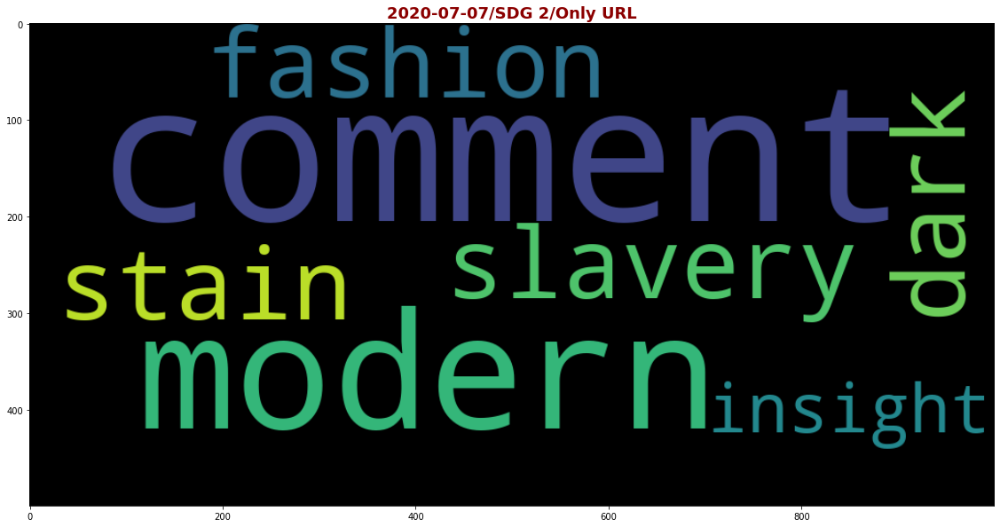

In [ ]:
urls = ast.literal_eval(x['SDG_2_url'][0])
word = clean_wordsList(return_end_title(set(urls)),stop_words)
cout_words = Counter(word)
wordcloud = WordCloud(max_words =70,max_font_size=200, width=1000, height=500)
wordcloud.generate_from_frequencies(frequencies = cout_words)  
plt.figure(figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.title('2020-07-07/SDG 2/Only URL', {'fontsize': 18, 'color':'darkred', 'weight':'bold'})

In [ ]:
!pip install pyquery

In [ ]:
from pyquery import PyQuery as pq


In [ ]:
text = """Comment: Leicester modern slavery claims are a dark stain on fashion Investigations 
into allegations of poor working practices in Leicester will not expose anything the fashion industry 
does not already know, and should have already acted upon Covid-19 has hit the most vulnerable in our 
industry the hardest. Writing about the pandemic’s devastating toll on fashion over recent months, the 
story that has stayed with me is the stark situation confronting garment workers in Bangladesh, who face 
starvation as cancelled orders force factories to lay off staff. However, over the past week, reports about
 unacceptable and unsafe conditions in a small number of Leicester factories have reminded us all that 
 there are vulnerable garment workers far closer to home. At the weekend, an undercover The Sunday Times 
 investigation claimed workers at a factory in Leicester making clothes for Boohoo Group were paid as 
 little as £3.50/hour. The report also alleged that there was little evidence of social-distancing measures 
 in the factory, despite the city last week becoming the first in the UK to be forced local lockdown amid 
 rising numbers of Covid-19 cases. That investigation came just days after a report from campaign group Labour 
 Behind the Label claimed that factories in Leicester, also producing for Boohoo Group, did not adhere to 
 social-distancing measures and that workers were told they must come to work, even if they had symptoms of 
 the virus. Boohoo Group has said it does not hesitate to terminate relationships with suppliers that fail 
 to adhere to its code of conduct, and insisted that its early investigations have found that the factory 
 highlighted by The Sunday Times is not a declared supplier, and is no longer trading as a garment manufacturer.
 It argued that another company is using the supplier’s premises and the group is investigating that company’s
  identity, as well as ensuring suppliers immediately cease working with this company, and reviewing its 
  relationship with any suppliers that have subcontracted work to the manufacturer in question. The fast fashion 
  giant said it would investigate Labour Behind the Label’s claims, but argued that the report was inaccurate and
 lacked credibility. The allegations have, at least temporarily, hit the previously unbreakable Boohoo: the group’s 
 value plunged by £1.1bn on London’s AIM market on Tuesday, as the shares fell 23% to 297p. Government scrutiny
At the behest of home secretary Priti Patel, the National Crime Agency has launched an investigation into Leicester’s 
textile industry over the allegations of modern slavery. But the sad truth is that the investigation will not expose 
anything that the fashion industry does not already know and has known for many years. These issues have been brought 
to light before, only to be allowed to sink back into the dark. A Channel 4 documentary in 2017 previously exposed 
poor working conditions in Leicester. The Dispatches investigation found garment workers producing for some of the 
high street’s biggest names, including Boohoo, River Island and New Look, were being paid between £3 and £3.50/hour. 
Factory bosses told an undercover reporter they could not pay more because of competition from cheaper producing 
countries such as China and Bangladesh. At the time, retailers named in the allegations said production had been 
outsourced to other factories without their knowledge and promised to launch investigations. Yet it seems little 
has changed. Many factories in Leicester follow best practice to the letter and create well-made garments while 
paying a fair wage and ensuring workers are safe. But these few unscrupulous, exploitative suppliers are an 
embarrassing stain on our industry. Retailers need to do everything in their power to ensure their clothes are 
not being made in factories that fall short of the acceptable standards, wherever they are in the world. Ignorance 
is not an excuse – businesses need a clear view of what is happening across their entire supply chains, including 
second-tier suppliers. Fashion has a once-in-a-lifetime opportunity to rethink how it does business after Covid-19 
and the industry must seize it to build a fairer future for all."""



In [ ]:
tokens = re.findall('\w\w+',text)
tokens = [w.lower() for w in tokens]
tokens = [w for w in tokens if w in words.words()]
tokens = [w for w in tokens if not w in stop_words]  

Text(0.5, 1.0, '2020-07-07/SDG1 & SDG2/article')

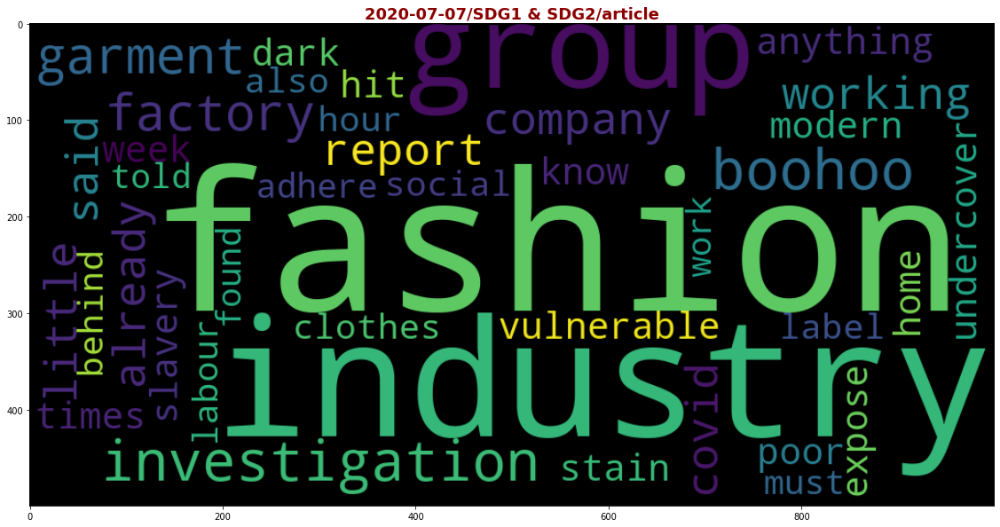

In [ ]:
cout_words = Counter(tokens)
wordcloud = WordCloud(max_words =40,max_font_size=200, width=1000, height=500)
wordcloud.generate_from_frequencies(frequencies = cout_words)  
plt.figure(figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.title('2020-07-07/SDG1 & SDG2/article', {'fontsize': 18, 'color':'darkred', 'weight':'bold'})


In [ ]:
cout_words

Counter({'acceptable': 1,
         'across': 1,
         'adhere': 2,
         'agency': 1,
         'aim': 1,
         'already': 3,
         'also': 2,
         'amid': 1,
         'another': 1,
         'anything': 2,
         'back': 1,
         'becoming': 1,
         'behest': 1,
         'behind': 2,
         'best': 1,
         'biggest': 1,
         'boohoo': 5,
         'brought': 1,
         'build': 1,
         'business': 1,
         'came': 1,
         'campaign': 1,
         'cease': 1,
         'channel': 1,
         'china': 1,
         'city': 1,
         'clear': 1,
         'closer': 1,
         'clothes': 2,
         'code': 1,
         'come': 1,
         'comment': 1,
         'company': 3,
         'competition': 1,
         'conduct': 1,
         'could': 1,
         'covid': 3,
         'create': 1,
         'credibility': 1,
         'crime': 1,
         'dark': 2,
         'days': 1,
         'declared': 1,
         'despite': 1,
         'devastating': 1,
 